<a href="https://colab.research.google.com/github/WilliamShengYangHuang/AALU_Coding/blob/main/Pix2Pix_data_compiler.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [50]:
from PIL import Image
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [34]:
# Settings
size = 256  # Image size
num = 30  # Number of images
count = 0

In [35]:
pathA = '/content/drive/MyDrive/test/a'  # Dataset A path
pathB = '/content/drive/MyDrive/test/b'  # Dataset B path
save_path = '/content/drive/MyDrive/test/test_saved_pairs/'  # Save path

In [36]:
# Create the save directory if it doesn't exist
if not os.path.exists(save_path):
    os.makedirs(save_path)

In [51]:
# Load images
def load_imgs(path, num, size):
    imgs = []
    for i in range(num):
        file_name = f"{i}.jpg"
        img_path = os.path.join(path, file_name)
        img = Image.open(img_path).resize((size, size))
        imgs.append(img)
    return imgs

def pil_to_cv(pil_img):
    return cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)

# Function to preview images
def preview_images(images, title, img_num):
    plt.figure(figsize=(img_num, img_num*2))
    for i in range(min(preview_num, len(images))):
        plt.subplot(1, preview_num, i+1)
        plt.imshow(images[i])
        plt.title(f"{title} {i}")
        plt.axis('off')
    plt.show()

imgA = load_imgs(pathA, num, size)
imgB = load_imgs(pathB, num, size)

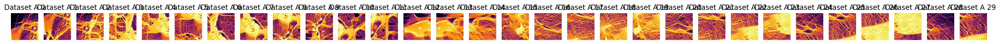

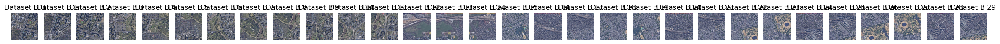

In [49]:
# Preview images from datasets A and B
# Number of images to preview
preview_num = 31  #@param{type:'slider', mix:0, max:100, stpe:1}
preview_images(imgA, "Dataset A", preview_num)
preview_images(imgB, "Dataset B", preview_num)

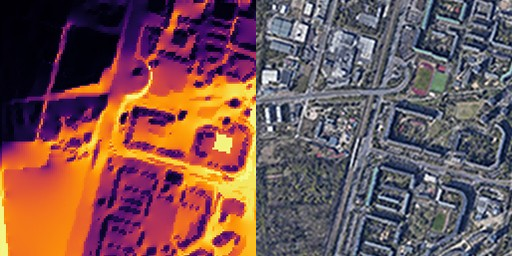


pair 1 completed


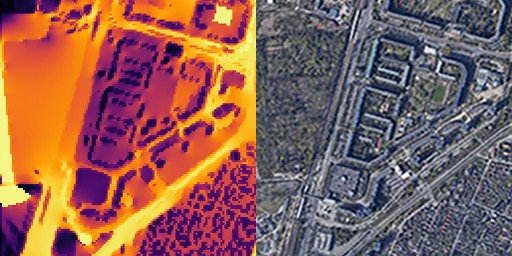


pair 2 completed


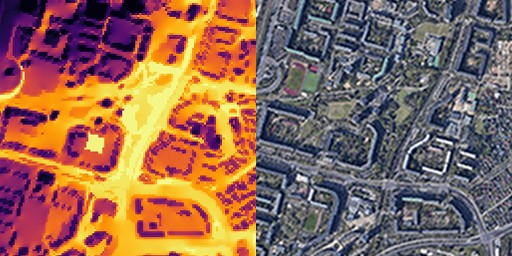


pair 3 completed


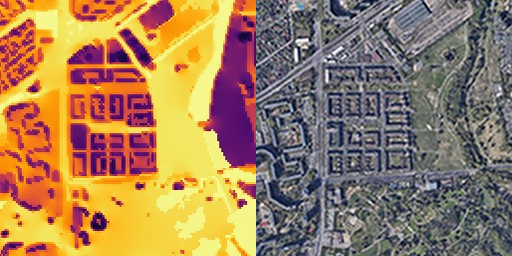


pair 4 completed


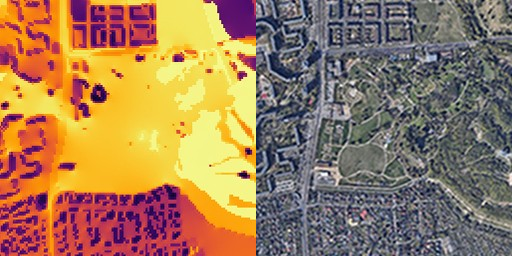


pair 5 completed


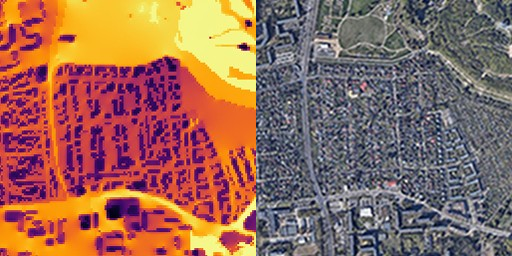


pair 6 completed


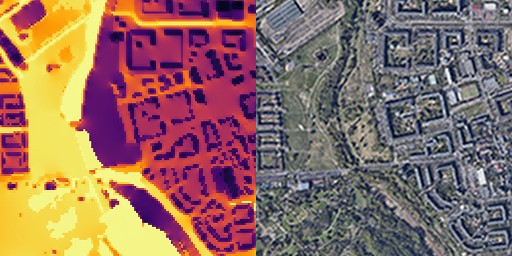


pair 7 completed


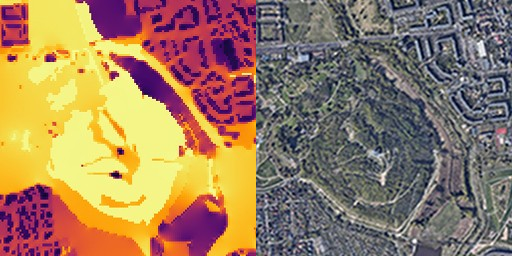


pair 8 completed


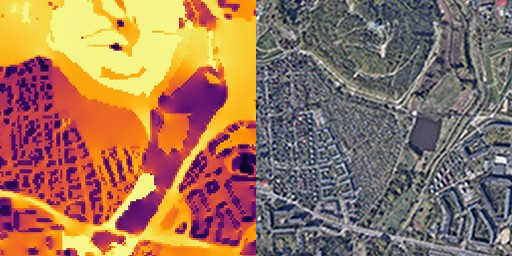


pair 9 completed


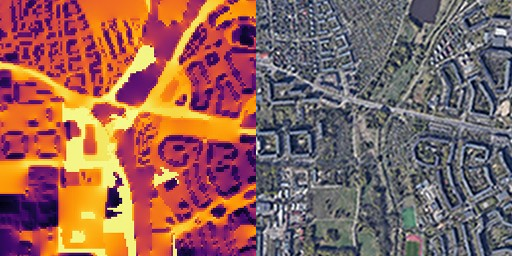


pair 10 completed


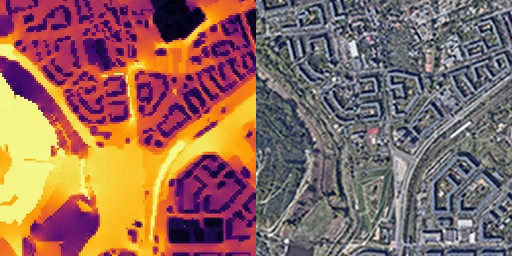


pair 11 completed


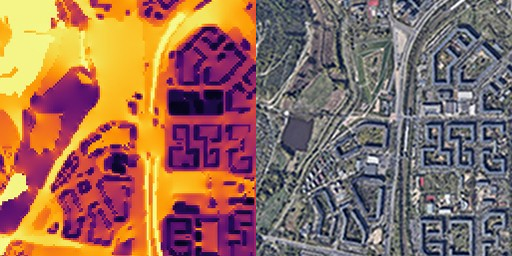


pair 12 completed


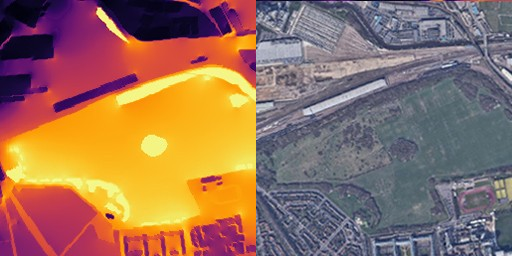


pair 13 completed


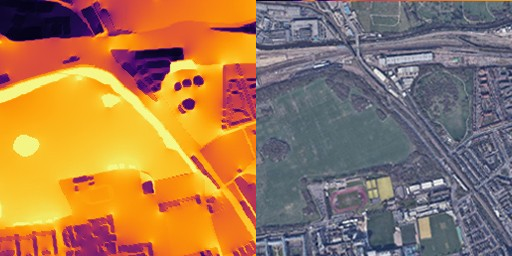


pair 14 completed


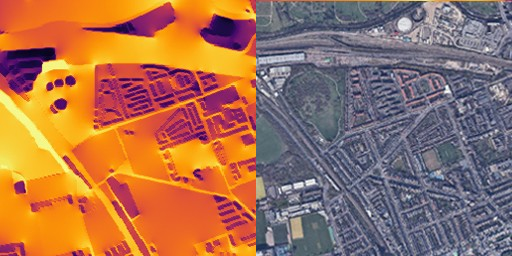


pair 15 completed


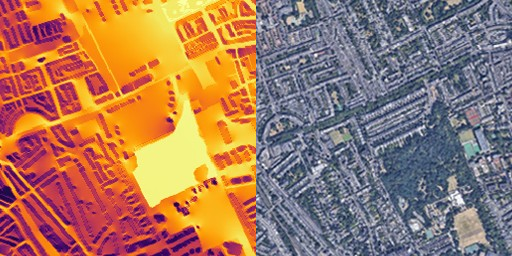


pair 16 completed


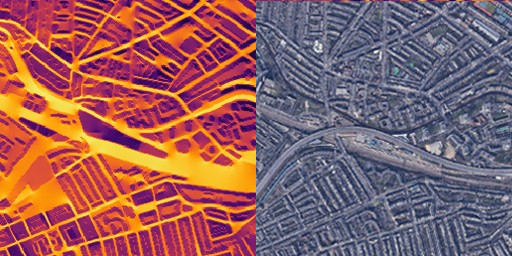


pair 17 completed


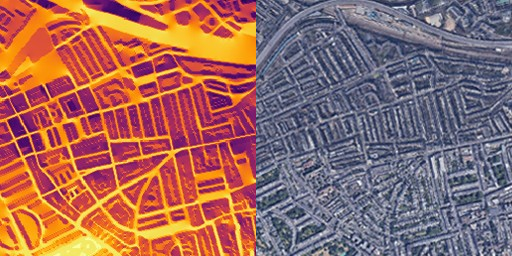


pair 18 completed


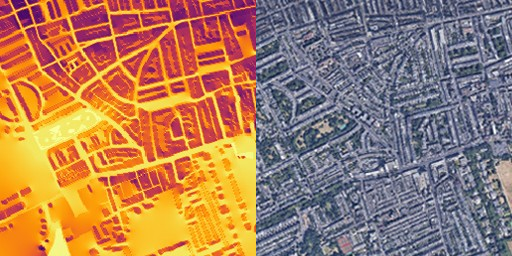


pair 19 completed


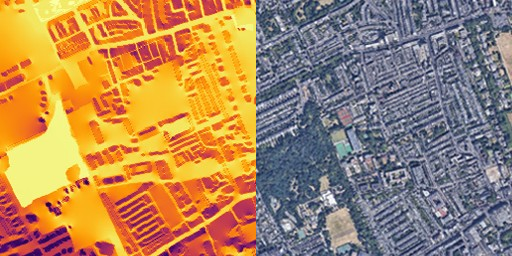


pair 20 completed


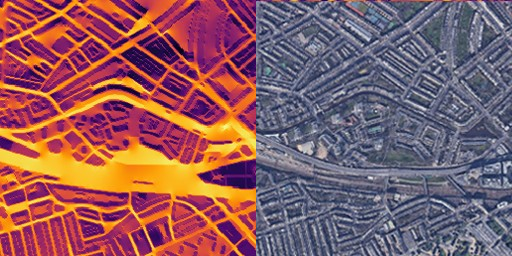


pair 21 completed


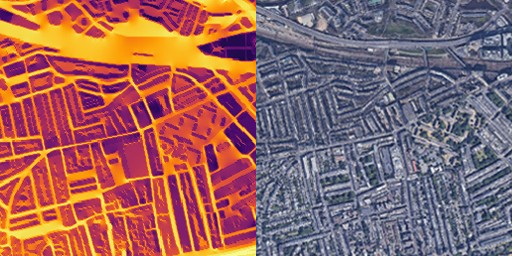


pair 22 completed


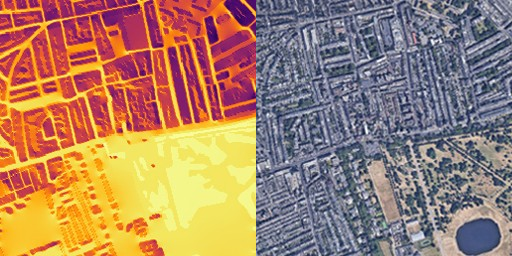


pair 23 completed


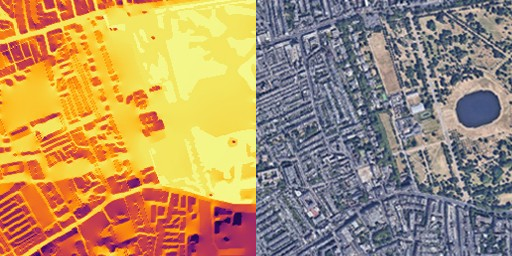


pair 24 completed


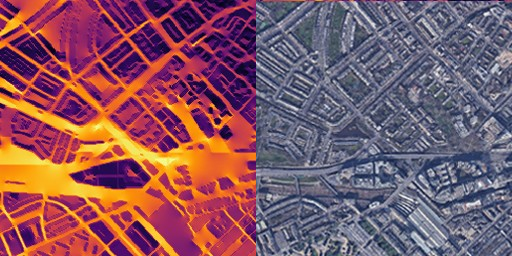


pair 25 completed


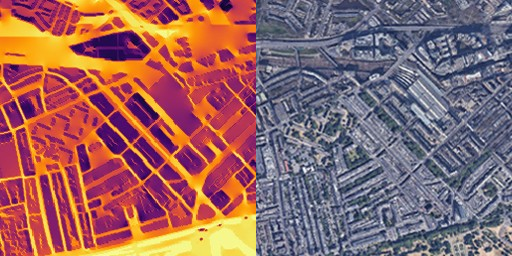


pair 26 completed


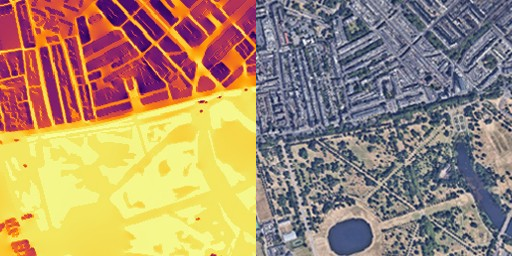


pair 27 completed


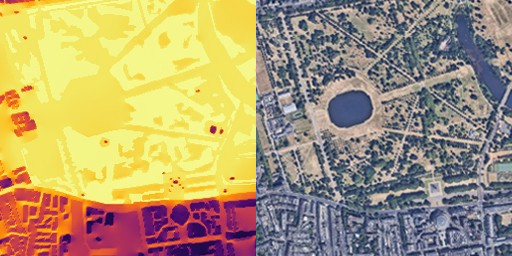


pair 28 completed


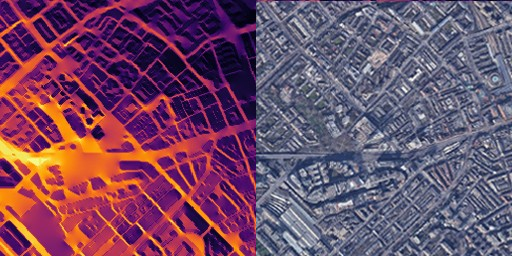


pair 29 completed


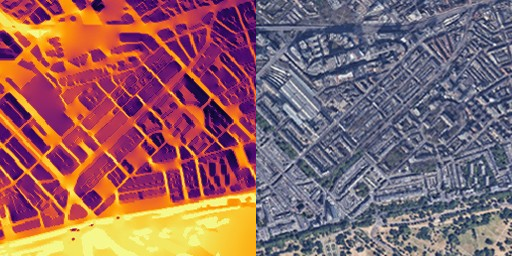


pair 30 completed
30 pairs ready for pix2pix!


In [52]:
# Pair images, save and preview each pair using OpenCV
for count in range(num):
    img_pair = Image.new('RGB', (size * 2, size))
    img_pair.paste(imgA[count], (0, 0))
    img_pair.paste(imgB[count], (size, 0))

    # Convert PIL image to OpenCV format
    img_pair_cv = pil_to_cv(img_pair)

    # Save the paired image
    paired_image_path = os.path.join(save_path, f"{count}.jpg")
    img_pair.save(paired_image_path)

    # Preview the paired image using OpenCV
    cv2_imshow(img_pair_cv)
    cv2.waitKey(500)  # Display each image for 500 ms
    cv2.destroyAllWindows()

    print(f"\npair {count + 1} completed")

cv2.destroyAllWindows()
print(f"{count + 1} pairs ready for pix2pix!")